In [1]:
import numpy as np
import pandas as pd
import os
import math
import random 
import cv2 as cv

from scipy import stats #Analysis 
from scipy.stats import norm 

import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

1. Data Load
치매 예방을 위한 라이프로그 치매 분류

9,327 rows × 2 columns x 5 picture

For more details https://aihub.or.kr/problem_contest/nipa-learning-platform/6

In [27]:
# original data : data 

path = "../pic_dataset"

FAST_RUN = False
IMAGE_WIDTH=34
IMAGE_HEIGHT=34
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=1

filenames = os.listdir(path)
categories = []
sobee = []

# data = cv.imread('/content/gdrive/My Drive/CoLab/Dataset/pic_dataset/CN_0.png', 0)
# img = cv.resize(data, None, fx=28/349, fy=28/231)
# print(img/255)
# print(img.shape)

for filename in filenames:
    category = filename.split('_')[0]
    categories.append(category)
#    if category == 'CN':
#        categories.append(0)
#    elif  category == 'MCI':
#        categories.append(1)
#    else:
#        categories.append(2)

data = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

data

,filename,category
0,CN_0.png,CN
1,CN_1.png,CN
2,CN_10.png,CN
3,CN_1000.png,CN
4,CN_1001.png,CN
...,...,...
9322,MCI_95.png,MCI
9323,MCI_96.png,MCI
9324,MCI_97.png,MCI
9325,MCI_98.png,MCI


2. EDA
9,327 rows × 66 columns

148명에 대한 데일리 라이프로그 데이터
크게 1. 기본 정보 2. 걸음거리 3.수면 4.컨버팅 데이터로 나눌 수 있겠습니다.

4. converting

CONVERT(activity_class_5min USING utf8)
CONVERT(activity_met_1min USING utf8)
CONVERT(sleep_hr_5min USING utf8)
CONVERT(sleep_hypnogram_5min USING utf8)
CONVERT(sleep_rmssd_5min USING utf8)
y variable

DIAG_NM
정상(CN), 경도인지 장애(MCI), 치매(Dem)

In [28]:
data.shape

(9327, 2)

In [60]:
y_my = data['category'].copy()
y_my

0        CN
1        CN
2        CN
3        CN
4        CN
       ... 
9322    MCI
9323    MCI
9324    MCI
9325    MCI
9326    MCI
Name: category, Length: 9327, dtype: object

In [5]:
for i in range(len(filenames)):
  mypath = path + '/' + filenames[i]
  print(mypath)
  data = cv.imread(mypath, 0)
  img = cv.resize(data, None, fx=28/349, fy=28/231)
  img = img/255
  sobee.append(img)

../pic_dataset/CN_0.png
../pic_dataset/CN_1.png
../pic_dataset/CN_10.png
../pic_dataset/CN_1000.png
../pic_dataset/CN_1001.png
../pic_dataset/CN_1002.png
../pic_dataset/CN_1003.png
../pic_dataset/CN_1004.png
../pic_dataset/CN_1005.png
../pic_dataset/CN_1006.png
../pic_dataset/CN_1007.png
../pic_dataset/CN_1008.png
../pic_dataset/CN_1009.png
../pic_dataset/CN_1010.png
../pic_dataset/CN_1011.png
../pic_dataset/CN_1012.png
../pic_dataset/CN_1013.png
../pic_dataset/CN_1014.png
../pic_dataset/CN_1015.png
../pic_dataset/CN_1016.png
../pic_dataset/CN_1017.png
../pic_dataset/CN_1018.png
../pic_dataset/CN_1019.png
../pic_dataset/CN_1020.png
../pic_dataset/CN_1021.png
../pic_dataset/CN_1022.png
../pic_dataset/CN_1023.png
../pic_dataset/CN_1024.png
../pic_dataset/CN_1025.png
../pic_dataset/CN_1026.png
../pic_dataset/CN_1027.png
../pic_dataset/CN_1028.png
../pic_dataset/CN_11.png
../pic_dataset/CN_1176.png
../pic_dataset/CN_1177.png
../pic_dataset/CN_1178.png
../pic_dataset/CN_1179.png
../pic_data

../pic_dataset/CN_1678.png
../pic_dataset/CN_1679.png
../pic_dataset/CN_1680.png
../pic_dataset/CN_1681.png
../pic_dataset/CN_1682.png
../pic_dataset/CN_1683.png
../pic_dataset/CN_1684.png
../pic_dataset/CN_1685.png
../pic_dataset/CN_1686.png
../pic_dataset/CN_1687.png
../pic_dataset/CN_1688.png
../pic_dataset/CN_1689.png
../pic_dataset/CN_169.png
../pic_dataset/CN_1690.png
../pic_dataset/CN_1691.png
../pic_dataset/CN_1692.png
../pic_dataset/CN_1693.png
../pic_dataset/CN_1694.png
../pic_dataset/CN_1695.png
../pic_dataset/CN_1696.png
../pic_dataset/CN_1697.png
../pic_dataset/CN_1698.png
../pic_dataset/CN_1699.png
../pic_dataset/CN_17.png
../pic_dataset/CN_170.png
../pic_dataset/CN_1700.png
../pic_dataset/CN_1701.png
../pic_dataset/CN_1702.png
../pic_dataset/CN_1703.png
../pic_dataset/CN_1704.png
../pic_dataset/CN_1705.png
../pic_dataset/CN_1706.png
../pic_dataset/CN_1707.png
../pic_dataset/CN_1708.png
../pic_dataset/CN_1709.png
../pic_dataset/CN_171.png
../pic_dataset/CN_1710.png
../pic

../pic_dataset/CN_2204.png
../pic_dataset/CN_2205.png
../pic_dataset/CN_2206.png
../pic_dataset/CN_2207.png
../pic_dataset/CN_2208.png
../pic_dataset/CN_2209.png
../pic_dataset/CN_221.png
../pic_dataset/CN_2210.png
../pic_dataset/CN_2211.png
../pic_dataset/CN_2212.png
../pic_dataset/CN_2213.png
../pic_dataset/CN_2214.png
../pic_dataset/CN_2215.png
../pic_dataset/CN_2216.png
../pic_dataset/CN_2217.png
../pic_dataset/CN_2218.png
../pic_dataset/CN_2219.png
../pic_dataset/CN_222.png
../pic_dataset/CN_2220.png
../pic_dataset/CN_2221.png
../pic_dataset/CN_2222.png
../pic_dataset/CN_2223.png
../pic_dataset/CN_2224.png
../pic_dataset/CN_2225.png
../pic_dataset/CN_2226.png
../pic_dataset/CN_2227.png
../pic_dataset/CN_2228.png
../pic_dataset/CN_2229.png
../pic_dataset/CN_223.png
../pic_dataset/CN_2230.png
../pic_dataset/CN_2231.png
../pic_dataset/CN_2232.png
../pic_dataset/CN_2233.png
../pic_dataset/CN_2234.png
../pic_dataset/CN_2235.png
../pic_dataset/CN_2236.png
../pic_dataset/CN_2237.png
../p

../pic_dataset/CN_2551.png
../pic_dataset/CN_2552.png
../pic_dataset/CN_2553.png
../pic_dataset/CN_2554.png
../pic_dataset/CN_2555.png
../pic_dataset/CN_2556.png
../pic_dataset/CN_2557.png
../pic_dataset/CN_2558.png
../pic_dataset/CN_2559.png
../pic_dataset/CN_2560.png
../pic_dataset/CN_2561.png
../pic_dataset/CN_2562.png
../pic_dataset/CN_2563.png
../pic_dataset/CN_2564.png
../pic_dataset/CN_2565.png
../pic_dataset/CN_2566.png
../pic_dataset/CN_2567.png
../pic_dataset/CN_2568.png
../pic_dataset/CN_2569.png
../pic_dataset/CN_2570.png
../pic_dataset/CN_2571.png
../pic_dataset/CN_2572.png
../pic_dataset/CN_2573.png
../pic_dataset/CN_2574.png
../pic_dataset/CN_2575.png
../pic_dataset/CN_2576.png
../pic_dataset/CN_2577.png
../pic_dataset/CN_2578.png
../pic_dataset/CN_2579.png
../pic_dataset/CN_2580.png
../pic_dataset/CN_2581.png
../pic_dataset/CN_2582.png
../pic_dataset/CN_2583.png
../pic_dataset/CN_2584.png
../pic_dataset/CN_2585.png
../pic_dataset/CN_2586.png
../pic_dataset/CN_2587.png
.

../pic_dataset/CN_284.png
../pic_dataset/CN_2840.png
../pic_dataset/CN_2841.png
../pic_dataset/CN_2842.png
../pic_dataset/CN_2843.png
../pic_dataset/CN_2844.png
../pic_dataset/CN_2845.png
../pic_dataset/CN_2846.png
../pic_dataset/CN_2847.png
../pic_dataset/CN_2848.png
../pic_dataset/CN_2849.png
../pic_dataset/CN_285.png
../pic_dataset/CN_2850.png
../pic_dataset/CN_2851.png
../pic_dataset/CN_2852.png
../pic_dataset/CN_2853.png
../pic_dataset/CN_2854.png
../pic_dataset/CN_2855.png
../pic_dataset/CN_2856.png
../pic_dataset/CN_2857.png
../pic_dataset/CN_2858.png
../pic_dataset/CN_2859.png
../pic_dataset/CN_286.png
../pic_dataset/CN_2860.png
../pic_dataset/CN_2861.png
../pic_dataset/CN_2862.png
../pic_dataset/CN_2863.png
../pic_dataset/CN_2864.png
../pic_dataset/CN_2865.png
../pic_dataset/CN_2866.png
../pic_dataset/CN_2867.png
../pic_dataset/CN_2868.png
../pic_dataset/CN_2869.png
../pic_dataset/CN_287.png
../pic_dataset/CN_2870.png
../pic_dataset/CN_2871.png
../pic_dataset/CN_2872.png
../pi

../pic_dataset/CN_3175.png
../pic_dataset/CN_3176.png
../pic_dataset/CN_3177.png
../pic_dataset/CN_3178.png
../pic_dataset/CN_3179.png
../pic_dataset/CN_318.png
../pic_dataset/CN_3180.png
../pic_dataset/CN_3181.png
../pic_dataset/CN_3182.png
../pic_dataset/CN_3183.png
../pic_dataset/CN_3184.png
../pic_dataset/CN_3185.png
../pic_dataset/CN_3186.png
../pic_dataset/CN_3187.png
../pic_dataset/CN_3188.png
../pic_dataset/CN_3189.png
../pic_dataset/CN_319.png
../pic_dataset/CN_3190.png
../pic_dataset/CN_3191.png
../pic_dataset/CN_3192.png
../pic_dataset/CN_3193.png
../pic_dataset/CN_3194.png
../pic_dataset/CN_3195.png
../pic_dataset/CN_3196.png
../pic_dataset/CN_3197.png
../pic_dataset/CN_3198.png
../pic_dataset/CN_3199.png
../pic_dataset/CN_32.png
../pic_dataset/CN_320.png
../pic_dataset/CN_3200.png
../pic_dataset/CN_3201.png
../pic_dataset/CN_3202.png
../pic_dataset/CN_3203.png
../pic_dataset/CN_3204.png
../pic_dataset/CN_3205.png
../pic_dataset/CN_3206.png
../pic_dataset/CN_3207.png
../pic

../pic_dataset/CN_3680.png
../pic_dataset/CN_3681.png
../pic_dataset/CN_3682.png
../pic_dataset/CN_3683.png
../pic_dataset/CN_3684.png
../pic_dataset/CN_3685.png
../pic_dataset/CN_3686.png
../pic_dataset/CN_3687.png
../pic_dataset/CN_3688.png
../pic_dataset/CN_3689.png
../pic_dataset/CN_3690.png
../pic_dataset/CN_3691.png
../pic_dataset/CN_3692.png
../pic_dataset/CN_3693.png
../pic_dataset/CN_3694.png
../pic_dataset/CN_3695.png
../pic_dataset/CN_3696.png
../pic_dataset/CN_3697.png
../pic_dataset/CN_3698.png
../pic_dataset/CN_3699.png
../pic_dataset/CN_37.png
../pic_dataset/CN_3700.png
../pic_dataset/CN_3701.png
../pic_dataset/CN_3702.png
../pic_dataset/CN_3703.png
../pic_dataset/CN_3704.png
../pic_dataset/CN_3705.png
../pic_dataset/CN_3706.png
../pic_dataset/CN_3707.png
../pic_dataset/CN_3708.png
../pic_dataset/CN_3709.png
../pic_dataset/CN_3710.png
../pic_dataset/CN_3711.png
../pic_dataset/CN_3712.png
../pic_dataset/CN_3713.png
../pic_dataset/CN_3714.png
../pic_dataset/CN_3715.png
../

../pic_dataset/CN_4239.png
../pic_dataset/CN_424.png
../pic_dataset/CN_4240.png
../pic_dataset/CN_4241.png
../pic_dataset/CN_4242.png
../pic_dataset/CN_4243.png
../pic_dataset/CN_4244.png
../pic_dataset/CN_4245.png
../pic_dataset/CN_4246.png
../pic_dataset/CN_4247.png
../pic_dataset/CN_4248.png
../pic_dataset/CN_4249.png
../pic_dataset/CN_425.png
../pic_dataset/CN_4250.png
../pic_dataset/CN_4251.png
../pic_dataset/CN_4252.png
../pic_dataset/CN_4253.png
../pic_dataset/CN_4254.png
../pic_dataset/CN_4255.png
../pic_dataset/CN_4256.png
../pic_dataset/CN_4257.png
../pic_dataset/CN_4258.png
../pic_dataset/CN_4259.png
../pic_dataset/CN_426.png
../pic_dataset/CN_4260.png
../pic_dataset/CN_4261.png
../pic_dataset/CN_4262.png
../pic_dataset/CN_4263.png
../pic_dataset/CN_4264.png
../pic_dataset/CN_4265.png
../pic_dataset/CN_4266.png
../pic_dataset/CN_4267.png
../pic_dataset/CN_4268.png
../pic_dataset/CN_4269.png
../pic_dataset/CN_427.png
../pic_dataset/CN_4270.png
../pic_dataset/CN_4271.png
../pi

../pic_dataset/CN_4584.png
../pic_dataset/CN_4585.png
../pic_dataset/CN_4586.png
../pic_dataset/CN_4587.png
../pic_dataset/CN_4588.png
../pic_dataset/CN_4589.png
../pic_dataset/CN_4590.png
../pic_dataset/CN_4591.png
../pic_dataset/CN_4592.png
../pic_dataset/CN_4593.png
../pic_dataset/CN_4594.png
../pic_dataset/CN_4595.png
../pic_dataset/CN_4596.png
../pic_dataset/CN_4597.png
../pic_dataset/CN_4598.png
../pic_dataset/CN_4599.png
../pic_dataset/CN_4600.png
../pic_dataset/CN_4601.png
../pic_dataset/CN_4602.png
../pic_dataset/CN_4603.png
../pic_dataset/CN_4604.png
../pic_dataset/CN_4605.png
../pic_dataset/CN_4606.png
../pic_dataset/CN_4607.png
../pic_dataset/CN_4608.png
../pic_dataset/CN_4609.png
../pic_dataset/CN_4610.png
../pic_dataset/CN_4611.png
../pic_dataset/CN_4612.png
../pic_dataset/CN_4613.png
../pic_dataset/CN_4614.png
../pic_dataset/CN_4615.png
../pic_dataset/CN_4616.png
../pic_dataset/CN_4617.png
../pic_dataset/CN_4618.png
../pic_dataset/CN_4619.png
../pic_dataset/CN_4620.png
.

../pic_dataset/CN_5176.png
../pic_dataset/CN_5177.png
../pic_dataset/CN_5178.png
../pic_dataset/CN_5179.png
../pic_dataset/CN_5180.png
../pic_dataset/CN_5181.png
../pic_dataset/CN_5182.png
../pic_dataset/CN_5183.png
../pic_dataset/CN_5184.png
../pic_dataset/CN_5185.png
../pic_dataset/CN_5186.png
../pic_dataset/CN_5187.png
../pic_dataset/CN_5188.png
../pic_dataset/CN_5189.png
../pic_dataset/CN_5190.png
../pic_dataset/CN_5261.png
../pic_dataset/CN_5262.png
../pic_dataset/CN_5263.png
../pic_dataset/CN_5264.png
../pic_dataset/CN_5265.png
../pic_dataset/CN_5266.png
../pic_dataset/CN_5267.png
../pic_dataset/CN_5268.png
../pic_dataset/CN_5269.png
../pic_dataset/CN_5270.png
../pic_dataset/CN_5271.png
../pic_dataset/CN_5272.png
../pic_dataset/CN_5273.png
../pic_dataset/CN_5274.png
../pic_dataset/CN_5275.png
../pic_dataset/CN_5276.png
../pic_dataset/CN_5277.png
../pic_dataset/CN_5278.png
../pic_dataset/CN_5279.png
../pic_dataset/CN_5280.png
../pic_dataset/CN_5281.png
../pic_dataset/CN_5282.png
.

../pic_dataset/CN_5861.png
../pic_dataset/CN_5862.png
../pic_dataset/CN_5863.png
../pic_dataset/CN_5864.png
../pic_dataset/CN_5865.png
../pic_dataset/CN_5866.png
../pic_dataset/CN_5867.png
../pic_dataset/CN_5868.png
../pic_dataset/CN_5869.png
../pic_dataset/CN_587.png
../pic_dataset/CN_5870.png
../pic_dataset/CN_5871.png
../pic_dataset/CN_5872.png
../pic_dataset/CN_5873.png
../pic_dataset/CN_5874.png
../pic_dataset/CN_5875.png
../pic_dataset/CN_5876.png
../pic_dataset/CN_5877.png
../pic_dataset/CN_5878.png
../pic_dataset/CN_5879.png
../pic_dataset/CN_588.png
../pic_dataset/CN_5880.png
../pic_dataset/CN_5881.png
../pic_dataset/CN_5882.png
../pic_dataset/CN_5883.png
../pic_dataset/CN_5884.png
../pic_dataset/CN_5885.png
../pic_dataset/CN_5886.png
../pic_dataset/CN_5887.png
../pic_dataset/CN_5888.png
../pic_dataset/CN_5889.png
../pic_dataset/CN_589.png
../pic_dataset/CN_5890.png
../pic_dataset/CN_5891.png
../pic_dataset/CN_5892.png
../pic_dataset/CN_5893.png
../pic_dataset/CN_5894.png
../p

../pic_dataset/CN_6510.png
../pic_dataset/CN_6511.png
../pic_dataset/CN_6512.png
../pic_dataset/CN_6513.png
../pic_dataset/CN_6514.png
../pic_dataset/CN_6515.png
../pic_dataset/CN_6516.png
../pic_dataset/CN_6517.png
../pic_dataset/CN_6518.png
../pic_dataset/CN_6519.png
../pic_dataset/CN_6520.png
../pic_dataset/CN_6521.png
../pic_dataset/CN_6522.png
../pic_dataset/CN_6523.png
../pic_dataset/CN_6524.png
../pic_dataset/CN_6525.png
../pic_dataset/CN_6526.png
../pic_dataset/CN_6527.png
../pic_dataset/CN_6528.png
../pic_dataset/CN_6529.png
../pic_dataset/CN_6530.png
../pic_dataset/CN_6531.png
../pic_dataset/CN_6532.png
../pic_dataset/CN_6533.png
../pic_dataset/CN_6534.png
../pic_dataset/CN_6535.png
../pic_dataset/CN_6536.png
../pic_dataset/CN_6537.png
../pic_dataset/CN_6538.png
../pic_dataset/CN_6539.png
../pic_dataset/CN_6540.png
../pic_dataset/CN_6541.png
../pic_dataset/CN_6542.png
../pic_dataset/CN_6543.png
../pic_dataset/CN_6544.png
../pic_dataset/CN_6545.png
../pic_dataset/CN_6546.png
.

../pic_dataset/CN_7231.png
../pic_dataset/CN_7232.png
../pic_dataset/CN_7233.png
../pic_dataset/CN_7234.png
../pic_dataset/CN_7235.png
../pic_dataset/CN_7236.png
../pic_dataset/CN_7237.png
../pic_dataset/CN_7238.png
../pic_dataset/CN_7239.png
../pic_dataset/CN_7240.png
../pic_dataset/CN_7241.png
../pic_dataset/CN_7242.png
../pic_dataset/CN_7243.png
../pic_dataset/CN_7244.png
../pic_dataset/CN_7245.png
../pic_dataset/CN_7246.png
../pic_dataset/CN_7247.png
../pic_dataset/CN_7248.png
../pic_dataset/CN_7249.png
../pic_dataset/CN_7250.png
../pic_dataset/CN_7251.png
../pic_dataset/CN_7252.png
../pic_dataset/CN_7253.png
../pic_dataset/CN_7254.png
../pic_dataset/CN_7255.png
../pic_dataset/CN_7256.png
../pic_dataset/CN_7257.png
../pic_dataset/CN_7258.png
../pic_dataset/CN_7259.png
../pic_dataset/CN_7260.png
../pic_dataset/CN_7261.png
../pic_dataset/CN_7262.png
../pic_dataset/CN_7263.png
../pic_dataset/CN_7264.png
../pic_dataset/CN_7265.png
../pic_dataset/CN_7266.png
../pic_dataset/CN_7267.png
.

../pic_dataset/CN_7769.png
../pic_dataset/CN_777.png
../pic_dataset/CN_7770.png
../pic_dataset/CN_7771.png
../pic_dataset/CN_7772.png
../pic_dataset/CN_7773.png
../pic_dataset/CN_7774.png
../pic_dataset/CN_7775.png
../pic_dataset/CN_7776.png
../pic_dataset/CN_7777.png
../pic_dataset/CN_7778.png
../pic_dataset/CN_7779.png
../pic_dataset/CN_778.png
../pic_dataset/CN_7780.png
../pic_dataset/CN_7781.png
../pic_dataset/CN_7782.png
../pic_dataset/CN_7783.png
../pic_dataset/CN_7784.png
../pic_dataset/CN_7785.png
../pic_dataset/CN_7786.png
../pic_dataset/CN_7787.png
../pic_dataset/CN_7788.png
../pic_dataset/CN_7789.png
../pic_dataset/CN_779.png
../pic_dataset/CN_7790.png
../pic_dataset/CN_7791.png
../pic_dataset/CN_7792.png
../pic_dataset/CN_7793.png
../pic_dataset/CN_7794.png
../pic_dataset/CN_7795.png
../pic_dataset/CN_7796.png
../pic_dataset/CN_7797.png
../pic_dataset/CN_7798.png
../pic_dataset/CN_7799.png
../pic_dataset/CN_780.png
../pic_dataset/CN_7800.png
../pic_dataset/CN_7801.png
../pi

../pic_dataset/CN_8452.png
../pic_dataset/CN_8453.png
../pic_dataset/CN_8454.png
../pic_dataset/CN_8455.png
../pic_dataset/CN_8456.png
../pic_dataset/CN_8457.png
../pic_dataset/CN_8458.png
../pic_dataset/CN_8459.png
../pic_dataset/CN_846.png
../pic_dataset/CN_8460.png
../pic_dataset/CN_8461.png
../pic_dataset/CN_8462.png
../pic_dataset/CN_8463.png
../pic_dataset/CN_8464.png
../pic_dataset/CN_8465.png
../pic_dataset/CN_8466.png
../pic_dataset/CN_8467.png
../pic_dataset/CN_8468.png
../pic_dataset/CN_8469.png
../pic_dataset/CN_847.png
../pic_dataset/CN_8470.png
../pic_dataset/CN_8471.png
../pic_dataset/CN_8472.png
../pic_dataset/CN_8473.png
../pic_dataset/CN_8474.png
../pic_dataset/CN_8475.png
../pic_dataset/CN_8476.png
../pic_dataset/CN_8477.png
../pic_dataset/CN_8478.png
../pic_dataset/CN_8479.png
../pic_dataset/CN_848.png
../pic_dataset/CN_8480.png
../pic_dataset/CN_8481.png
../pic_dataset/CN_8482.png
../pic_dataset/CN_8483.png
../pic_dataset/CN_8484.png
../pic_dataset/CN_8485.png
../p

../pic_dataset/CN_884.png
../pic_dataset/CN_8840.png
../pic_dataset/CN_8841.png
../pic_dataset/CN_8842.png
../pic_dataset/CN_8843.png
../pic_dataset/CN_8844.png
../pic_dataset/CN_8845.png
../pic_dataset/CN_8846.png
../pic_dataset/CN_8847.png
../pic_dataset/CN_8848.png
../pic_dataset/CN_8849.png
../pic_dataset/CN_885.png
../pic_dataset/CN_8850.png
../pic_dataset/CN_8851.png
../pic_dataset/CN_8852.png
../pic_dataset/CN_8853.png
../pic_dataset/CN_8854.png
../pic_dataset/CN_8855.png
../pic_dataset/CN_8856.png
../pic_dataset/CN_8857.png
../pic_dataset/CN_8858.png
../pic_dataset/CN_8859.png
../pic_dataset/CN_886.png
../pic_dataset/CN_8860.png
../pic_dataset/CN_8861.png
../pic_dataset/CN_8862.png
../pic_dataset/CN_8863.png
../pic_dataset/CN_8864.png
../pic_dataset/CN_8865.png
../pic_dataset/CN_8866.png
../pic_dataset/CN_8867.png
../pic_dataset/CN_8868.png
../pic_dataset/CN_8869.png
../pic_dataset/CN_887.png
../pic_dataset/CN_8870.png
../pic_dataset/CN_8871.png
../pic_dataset/CN_8872.png
../pi

../pic_dataset/CN_9131.png
../pic_dataset/CN_9132.png
../pic_dataset/CN_9133.png
../pic_dataset/CN_9134.png
../pic_dataset/CN_9135.png
../pic_dataset/CN_9136.png
../pic_dataset/CN_9137.png
../pic_dataset/CN_9138.png
../pic_dataset/CN_9139.png
../pic_dataset/CN_914.png
../pic_dataset/CN_9140.png
../pic_dataset/CN_9141.png
../pic_dataset/CN_9142.png
../pic_dataset/CN_9143.png
../pic_dataset/CN_9144.png
../pic_dataset/CN_9145.png
../pic_dataset/CN_9146.png
../pic_dataset/CN_9147.png
../pic_dataset/CN_9148.png
../pic_dataset/CN_9149.png
../pic_dataset/CN_915.png
../pic_dataset/CN_9150.png
../pic_dataset/CN_9151.png
../pic_dataset/CN_9152.png
../pic_dataset/CN_9153.png
../pic_dataset/CN_9154.png
../pic_dataset/CN_9155.png
../pic_dataset/CN_9156.png
../pic_dataset/CN_9157.png
../pic_dataset/CN_9158.png
../pic_dataset/CN_9159.png
../pic_dataset/CN_916.png
../pic_dataset/CN_9160.png
../pic_dataset/CN_9161.png
../pic_dataset/CN_9162.png
../pic_dataset/CN_9163.png
../pic_dataset/CN_9164.png
../p

../pic_dataset/Dem_1642.png
../pic_dataset/Dem_1643.png
../pic_dataset/Dem_1644.png
../pic_dataset/Dem_1645.png
../pic_dataset/Dem_1646.png
../pic_dataset/Dem_1647.png
../pic_dataset/Dem_1648.png
../pic_dataset/Dem_1649.png
../pic_dataset/Dem_1650.png
../pic_dataset/Dem_1651.png
../pic_dataset/Dem_1652.png
../pic_dataset/Dem_1653.png
../pic_dataset/Dem_1654.png
../pic_dataset/Dem_1655.png
../pic_dataset/Dem_1656.png
../pic_dataset/Dem_1657.png
../pic_dataset/Dem_1658.png
../pic_dataset/Dem_1659.png
../pic_dataset/Dem_1660.png
../pic_dataset/Dem_1661.png
../pic_dataset/Dem_1662.png
../pic_dataset/Dem_1663.png
../pic_dataset/Dem_1664.png
../pic_dataset/Dem_1665.png
../pic_dataset/Dem_1666.png
../pic_dataset/Dem_1667.png
../pic_dataset/Dem_1668.png
../pic_dataset/Dem_1669.png
../pic_dataset/Dem_1670.png
../pic_dataset/Dem_1671.png
../pic_dataset/Dem_1672.png
../pic_dataset/Dem_1673.png
../pic_dataset/Dem_1674.png
../pic_dataset/Dem_1675.png
../pic_dataset/Dem_1676.png
../pic_dataset/Dem_3

../pic_dataset/Dem_6638.png
../pic_dataset/Dem_6639.png
../pic_dataset/Dem_6640.png
../pic_dataset/Dem_6641.png
../pic_dataset/Dem_6642.png
../pic_dataset/Dem_6643.png
../pic_dataset/Dem_6644.png
../pic_dataset/Dem_6645.png
../pic_dataset/Dem_6646.png
../pic_dataset/Dem_6647.png
../pic_dataset/Dem_6648.png
../pic_dataset/Dem_6649.png
../pic_dataset/Dem_6650.png
../pic_dataset/Dem_6651.png
../pic_dataset/Dem_6652.png
../pic_dataset/Dem_6653.png
../pic_dataset/Dem_6654.png
../pic_dataset/Dem_6655.png
../pic_dataset/Dem_6656.png
../pic_dataset/Dem_6657.png
../pic_dataset/Dem_6658.png
../pic_dataset/Dem_702.png
../pic_dataset/Dem_703.png
../pic_dataset/Dem_704.png
../pic_dataset/Dem_705.png
../pic_dataset/Dem_706.png
../pic_dataset/Dem_707.png
../pic_dataset/Dem_708.png
../pic_dataset/Dem_709.png
../pic_dataset/Dem_710.png
../pic_dataset/Dem_711.png
../pic_dataset/Dem_712.png
../pic_dataset/Dem_713.png
../pic_dataset/Dem_714.png
../pic_dataset/Dem_715.png
../pic_dataset/Dem_716.png
../pic_

../pic_dataset/MCI_1090.png
../pic_dataset/MCI_1091.png
../pic_dataset/MCI_1092.png
../pic_dataset/MCI_1093.png
../pic_dataset/MCI_1094.png
../pic_dataset/MCI_1095.png
../pic_dataset/MCI_1096.png
../pic_dataset/MCI_1097.png
../pic_dataset/MCI_1098.png
../pic_dataset/MCI_1099.png
../pic_dataset/MCI_110.png
../pic_dataset/MCI_1100.png
../pic_dataset/MCI_1101.png
../pic_dataset/MCI_1102.png
../pic_dataset/MCI_1103.png
../pic_dataset/MCI_1104.png
../pic_dataset/MCI_1105.png
../pic_dataset/MCI_1106.png
../pic_dataset/MCI_1107.png
../pic_dataset/MCI_1108.png
../pic_dataset/MCI_1109.png
../pic_dataset/MCI_111.png
../pic_dataset/MCI_1110.png
../pic_dataset/MCI_1111.png
../pic_dataset/MCI_1112.png
../pic_dataset/MCI_1113.png
../pic_dataset/MCI_1114.png
../pic_dataset/MCI_1115.png
../pic_dataset/MCI_1116.png
../pic_dataset/MCI_1117.png
../pic_dataset/MCI_1118.png
../pic_dataset/MCI_1119.png
../pic_dataset/MCI_112.png
../pic_dataset/MCI_1120.png
../pic_dataset/MCI_1121.png
../pic_dataset/MCI_1122

../pic_dataset/MCI_1901.png
../pic_dataset/MCI_1902.png
../pic_dataset/MCI_1903.png
../pic_dataset/MCI_1904.png
../pic_dataset/MCI_1905.png
../pic_dataset/MCI_1906.png
../pic_dataset/MCI_1907.png
../pic_dataset/MCI_1908.png
../pic_dataset/MCI_1909.png
../pic_dataset/MCI_1910.png
../pic_dataset/MCI_1911.png
../pic_dataset/MCI_1912.png
../pic_dataset/MCI_1913.png
../pic_dataset/MCI_1914.png
../pic_dataset/MCI_1915.png
../pic_dataset/MCI_1916.png
../pic_dataset/MCI_1917.png
../pic_dataset/MCI_1918.png
../pic_dataset/MCI_1919.png
../pic_dataset/MCI_1920.png
../pic_dataset/MCI_1921.png
../pic_dataset/MCI_1922.png
../pic_dataset/MCI_1923.png
../pic_dataset/MCI_1924.png
../pic_dataset/MCI_1925.png
../pic_dataset/MCI_1926.png
../pic_dataset/MCI_1927.png
../pic_dataset/MCI_1928.png
../pic_dataset/MCI_1929.png
../pic_dataset/MCI_1930.png
../pic_dataset/MCI_1931.png
../pic_dataset/MCI_1932.png
../pic_dataset/MCI_1933.png
../pic_dataset/MCI_1934.png
../pic_dataset/MCI_1935.png
../pic_dataset/MCI_1

../pic_dataset/MCI_3334.png
../pic_dataset/MCI_3335.png
../pic_dataset/MCI_3336.png
../pic_dataset/MCI_3337.png
../pic_dataset/MCI_3338.png
../pic_dataset/MCI_3339.png
../pic_dataset/MCI_334.png
../pic_dataset/MCI_3340.png
../pic_dataset/MCI_3341.png
../pic_dataset/MCI_3342.png
../pic_dataset/MCI_3343.png
../pic_dataset/MCI_3344.png
../pic_dataset/MCI_3345.png
../pic_dataset/MCI_3346.png
../pic_dataset/MCI_3347.png
../pic_dataset/MCI_3348.png
../pic_dataset/MCI_3349.png
../pic_dataset/MCI_335.png
../pic_dataset/MCI_3350.png
../pic_dataset/MCI_3351.png
../pic_dataset/MCI_3352.png
../pic_dataset/MCI_3353.png
../pic_dataset/MCI_3354.png
../pic_dataset/MCI_3355.png
../pic_dataset/MCI_3356.png
../pic_dataset/MCI_3357.png
../pic_dataset/MCI_3358.png
../pic_dataset/MCI_3359.png
../pic_dataset/MCI_336.png
../pic_dataset/MCI_3360.png
../pic_dataset/MCI_3361.png
../pic_dataset/MCI_3362.png
../pic_dataset/MCI_3363.png
../pic_dataset/MCI_3364.png
../pic_dataset/MCI_3365.png
../pic_dataset/MCI_337.

../pic_dataset/MCI_4833.png
../pic_dataset/MCI_4834.png
../pic_dataset/MCI_4835.png
../pic_dataset/MCI_4836.png
../pic_dataset/MCI_4837.png
../pic_dataset/MCI_4838.png
../pic_dataset/MCI_4839.png
../pic_dataset/MCI_484.png
../pic_dataset/MCI_4840.png
../pic_dataset/MCI_4841.png
../pic_dataset/MCI_4842.png
../pic_dataset/MCI_4843.png
../pic_dataset/MCI_4844.png
../pic_dataset/MCI_4845.png
../pic_dataset/MCI_4846.png
../pic_dataset/MCI_4847.png
../pic_dataset/MCI_4848.png
../pic_dataset/MCI_4849.png
../pic_dataset/MCI_485.png
../pic_dataset/MCI_4850.png
../pic_dataset/MCI_4851.png
../pic_dataset/MCI_4852.png
../pic_dataset/MCI_4853.png
../pic_dataset/MCI_4854.png
../pic_dataset/MCI_4855.png
../pic_dataset/MCI_4856.png
../pic_dataset/MCI_4857.png
../pic_dataset/MCI_4858.png
../pic_dataset/MCI_4859.png
../pic_dataset/MCI_486.png
../pic_dataset/MCI_4860.png
../pic_dataset/MCI_4861.png
../pic_dataset/MCI_4862.png
../pic_dataset/MCI_4863.png
../pic_dataset/MCI_4864.png
../pic_dataset/MCI_4865

../pic_dataset/MCI_5392.png
../pic_dataset/MCI_5393.png
../pic_dataset/MCI_5394.png
../pic_dataset/MCI_5395.png
../pic_dataset/MCI_5396.png
../pic_dataset/MCI_5397.png
../pic_dataset/MCI_5398.png
../pic_dataset/MCI_5399.png
../pic_dataset/MCI_54.png
../pic_dataset/MCI_540.png
../pic_dataset/MCI_5400.png
../pic_dataset/MCI_5401.png
../pic_dataset/MCI_5402.png
../pic_dataset/MCI_5403.png
../pic_dataset/MCI_5404.png
../pic_dataset/MCI_5405.png
../pic_dataset/MCI_5406.png
../pic_dataset/MCI_5407.png
../pic_dataset/MCI_5408.png
../pic_dataset/MCI_5409.png
../pic_dataset/MCI_5410.png
../pic_dataset/MCI_5411.png
../pic_dataset/MCI_5412.png
../pic_dataset/MCI_5413.png
../pic_dataset/MCI_5414.png
../pic_dataset/MCI_5415.png
../pic_dataset/MCI_5416.png
../pic_dataset/MCI_5417.png
../pic_dataset/MCI_5418.png
../pic_dataset/MCI_5419.png
../pic_dataset/MCI_5420.png
../pic_dataset/MCI_5421.png
../pic_dataset/MCI_5422.png
../pic_dataset/MCI_5423.png
../pic_dataset/MCI_5424.png
../pic_dataset/MCI_5425

../pic_dataset/MCI_6716.png
../pic_dataset/MCI_6717.png
../pic_dataset/MCI_6718.png
../pic_dataset/MCI_6719.png
../pic_dataset/MCI_672.png
../pic_dataset/MCI_6720.png
../pic_dataset/MCI_6721.png
../pic_dataset/MCI_6722.png
../pic_dataset/MCI_6723.png
../pic_dataset/MCI_6724.png
../pic_dataset/MCI_6725.png
../pic_dataset/MCI_6726.png
../pic_dataset/MCI_6727.png
../pic_dataset/MCI_6728.png
../pic_dataset/MCI_6729.png
../pic_dataset/MCI_673.png
../pic_dataset/MCI_6730.png
../pic_dataset/MCI_6731.png
../pic_dataset/MCI_6732.png
../pic_dataset/MCI_6733.png
../pic_dataset/MCI_6734.png
../pic_dataset/MCI_6735.png
../pic_dataset/MCI_6736.png
../pic_dataset/MCI_6737.png
../pic_dataset/MCI_6738.png
../pic_dataset/MCI_6739.png
../pic_dataset/MCI_674.png
../pic_dataset/MCI_6740.png
../pic_dataset/MCI_6741.png
../pic_dataset/MCI_6742.png
../pic_dataset/MCI_6743.png
../pic_dataset/MCI_6744.png
../pic_dataset/MCI_6745.png
../pic_dataset/MCI_6746.png
../pic_dataset/MCI_6747.png
../pic_dataset/MCI_6748

../pic_dataset/MCI_7305.png
../pic_dataset/MCI_7306.png
../pic_dataset/MCI_7307.png
../pic_dataset/MCI_7308.png
../pic_dataset/MCI_7309.png
../pic_dataset/MCI_7310.png
../pic_dataset/MCI_7311.png
../pic_dataset/MCI_7312.png
../pic_dataset/MCI_7313.png
../pic_dataset/MCI_7314.png
../pic_dataset/MCI_7315.png
../pic_dataset/MCI_7316.png
../pic_dataset/MCI_7317.png
../pic_dataset/MCI_7318.png
../pic_dataset/MCI_7319.png
../pic_dataset/MCI_7320.png
../pic_dataset/MCI_7321.png
../pic_dataset/MCI_7322.png
../pic_dataset/MCI_7323.png
../pic_dataset/MCI_7324.png
../pic_dataset/MCI_7325.png
../pic_dataset/MCI_7326.png
../pic_dataset/MCI_7327.png
../pic_dataset/MCI_7328.png
../pic_dataset/MCI_7329.png
../pic_dataset/MCI_7330.png
../pic_dataset/MCI_7331.png
../pic_dataset/MCI_7332.png
../pic_dataset/MCI_7333.png
../pic_dataset/MCI_7334.png
../pic_dataset/MCI_7335.png
../pic_dataset/MCI_7336.png
../pic_dataset/MCI_7337.png
../pic_dataset/MCI_7338.png
../pic_dataset/MCI_7339.png
../pic_dataset/MCI_7

../pic_dataset/MCI_8286.png
../pic_dataset/MCI_8287.png
../pic_dataset/MCI_8288.png
../pic_dataset/MCI_8289.png
../pic_dataset/MCI_8290.png
../pic_dataset/MCI_8291.png
../pic_dataset/MCI_8292.png
../pic_dataset/MCI_8293.png
../pic_dataset/MCI_8294.png
../pic_dataset/MCI_8295.png
../pic_dataset/MCI_83.png
../pic_dataset/MCI_84.png
../pic_dataset/MCI_85.png
../pic_dataset/MCI_8514.png
../pic_dataset/MCI_8515.png
../pic_dataset/MCI_8516.png
../pic_dataset/MCI_8517.png
../pic_dataset/MCI_8518.png
../pic_dataset/MCI_8519.png
../pic_dataset/MCI_8520.png
../pic_dataset/MCI_8521.png
../pic_dataset/MCI_8522.png
../pic_dataset/MCI_8523.png
../pic_dataset/MCI_8524.png
../pic_dataset/MCI_8525.png
../pic_dataset/MCI_8526.png
../pic_dataset/MCI_8527.png
../pic_dataset/MCI_8528.png
../pic_dataset/MCI_8529.png
../pic_dataset/MCI_8530.png
../pic_dataset/MCI_8531.png
../pic_dataset/MCI_8532.png
../pic_dataset/MCI_8533.png
../pic_dataset/MCI_8534.png
../pic_dataset/MCI_8535.png
../pic_dataset/MCI_8536.pn

In [6]:
from __future__ import absolute_import, division, print_function, unicode_literals
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np
from IPython.display import Image

# in order to always get the same result
tf.random.set_seed(1)
np.random.seed(1)

In [8]:
input_img = Input(shape=(784,))
# encoder
encoder1 = Dense(128,activation='sigmoid')(input_img)
encoder2 = Dense(3, activation='sigmoid')(encoder1) ## 3차원으로 표현해야하기 때문
# decoder
decoder1 = Dense(128, activation='sigmoid')(encoder2)
decoder2 = Dense(784, activation='sigmoid')(decoder1)

# this model maps an input to its reconstruction
autoencoder = Model(inputs=input_img, outputs=decoder2)

In [9]:
npsobee = np.array(sobee)
print(type(npsobee))

<class 'numpy.ndarray'>


In [10]:
sobeeTrain = npsobee.reshape(len(sobee), 28*28)

In [11]:
sobee

[array([[1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.

In [12]:
sobeeTrain.shape

(9327, 784)

In [13]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 784)]             0         
_________________________________________________________________
dense (Dense)                (None, 128)               100480    
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 387       
_________________________________________________________________
dense_2 (Dense)              (None, 128)               512       
_________________________________________________________________
dense_3 (Dense)              (None, 784)               101136    
Total params: 202,515
Trainable params: 202,515
Non-trainable params: 0
_________________________________________________________________


In [14]:
opti = tf.keras.optimizers.Adam(learning_rate=0.01,name='Adam')

In [15]:
autoencoder.compile(optimizer=opti,loss='mse',metrics=['mse']) ## learning rate 를 좀더 0.01 로 크게했을때가 좀 더 낫다.

In [16]:
autoencoder.fit(sobeeTrain, sobeeTrain, ## 둘다 x_train 을 넣었다는 점이 point!!
                epochs=20,
                batch_size=32,
                shuffle=True,
                validation_data=(sobeeTrain, sobeeTrain))

Epoch 1/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0193 - mse: 0.0193 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 2/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 3/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 4/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 5/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 6/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 7/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0173 - mse: 0.0173 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 8/20
292/292 [==============================] - 1s 2ms/step - loss: 0.

In [17]:
encoder = Model(inputs=input_img, outputs=encoder2)

In [53]:
latent_vector = encoder.predict(sobeeTrain)

In [54]:
latent_vector.shape

(9327, 3)

In [55]:
latent_vector

array([[1.16667245e-04, 1.63495541e-04, 9.22601466e-05],
       [1.16654563e-04, 1.63465738e-04, 9.22413165e-05],
       [1.16690280e-04, 1.63495541e-04, 9.22474792e-05],
       ...,
       [1.16652889e-04, 1.63465738e-04, 9.22387699e-05],
       [1.16659903e-04, 1.63465738e-04, 9.22472100e-05],
       [1.16647221e-04, 1.63465738e-04, 9.22180989e-05]], dtype=float32)

In [61]:
y_my

0        CN
1        CN
2        CN
3        CN
4        CN
       ... 
9322    MCI
9323    MCI
9324    MCI
9325    MCI
9326    MCI
Name: category, Length: 9327, dtype: object

In [62]:
latent_vector = pd.DataFrame(latent_vector)

C:\Users\drago\AppData\Local\Temp/ipykernel_26444/1469193110.py:5: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


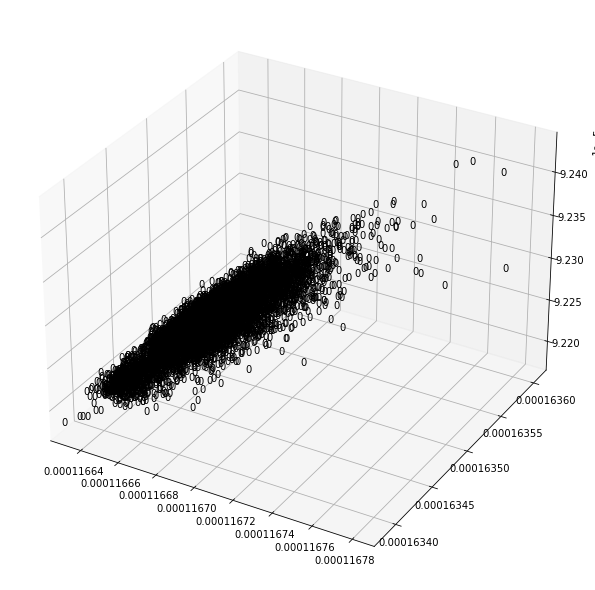

In [57]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 8

fig = plt.figure(1)
ax = Axes3D(fig)

xs = latent_vector[0]
ys = latent_vector[1]
zs = latent_vector[2]

color=['red','green','blue']

for x, y, z, in zip(xs, ys, zs):
    ax.text(x, y, z, 0)
    
ax.set_xlim(xs.min(), xs.max())
ax.set_ylim(ys.min(), ys.max())
ax.set_zlim(zs.min(), zs.max())

plt.show()

In [71]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_my = le.fit_transform(list(y_my))

In [72]:
y_my

array([0, 0, 0, ..., 2, 2, 2], dtype=int64)

In [69]:
latent_vector['category']=pd.DataFrame(y_my)

In [70]:
latent_vector

,0,1,2,category
0,0.000117,0.000163,0.000092,CN
1,0.000117,0.000163,0.000092,CN
2,0.000117,0.000163,0.000092,CN
3,0.000117,0.000163,0.000092,CN
4,0.000117,0.000163,0.000092,CN
...,...,...,...,...
9322,0.000117,0.000163,0.000092,MCI
9323,0.000117,0.000163,0.000092,MCI
9324,0.000117,0.000163,0.000092,MCI
9325,0.000117,0.000163,0.000092,MCI


C:\Users\drago\AppData\Local\Temp/ipykernel_26444/203301563.py:4: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig, elev=-150, azim=110)


ValueError: shape mismatch: objects cannot be broadcast to a single shape

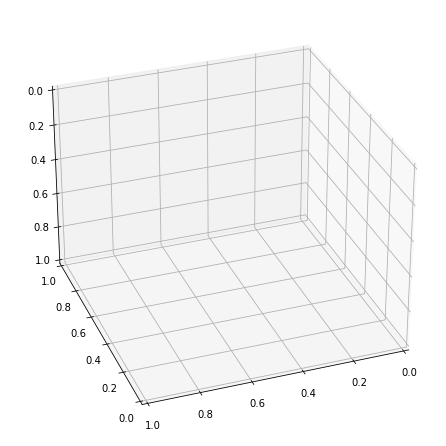

In [46]:
latent_vector = pd.concat([latent_vector,y],axis = 1)

fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(latent_vector[0],latent_vector[1],latent_vector[2], c=latent_vector["category"],
           cmap=plt.cm.Set1, edgecolor='k', s=10)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()